# Telecom Churn Case Study 

Author: Shivani Bhatia (www.linkedin.com/in/shivani-iiitb)

Author: Akshay Bhaskar (www.linkedin.com/in/akshaybhaskar)

# Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

![Customer Churn](https://files.oaiusercontent.com/file-nKDf1bzwqdiLhCXFxhmmFXbE?se=2024-09-10T21%3A54%3A51Z&sp=r&sv=2024-08-04&sr=b&rscc=max-age%3D604800%2C%20immutable%2C%20private&rscd=attachment%3B%20filename%3Dec3525fa-a25e-4f1a-9e8a-9dd991c36985.webp&sig=Wh1cLYBSjOgCf6EJWDGJKsryHcHVQuNDczhm4kBkzP8%3D)

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

#

# 1. Importing Libraries 

In [112]:
#Data Structures
import pandas as pd
import numpy as np
import re
import os

#Sklearn
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score

#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import statsmodels.api as sm

#Others
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

#

# 2. Getting Data from Kaggle API

In [113]:
pip install kaggle

Note: you may need to restart the kernel to use updated packages.


In [114]:
!pip install opendatasets

In [115]:
import opendatasets as od

In [116]:
dataset="https://www.kaggle.com/competitions/telecom-churn-case-study-hackathon-c-63/data"

In [117]:
od.download(dataset)

Skipping, found downloaded files in ".\telecom-churn-case-study-hackathon-c-63" (use force=True to force download)


In [118]:
import os

In [119]:
data_dir = 'telecom-churn-case-study-hackathon-c-63'

In [120]:
print(os.listdir(data_dir))
import pandas as pd

['.ipynb_checkpoints', 'Customer_Churn.jpg', 'data_dictionary.csv', 'sample.csv', 'starter-notebook - Labs 1.ipynb', 'test.csv', 'train.csv', 'untitled.txt']


In [121]:
# Ensure the os module is imported
print(os.listdir(data_dir))

['.ipynb_checkpoints', 'Customer_Churn.jpg', 'data_dictionary.csv', 'sample.csv', 'starter-notebook - Labs 1.ipynb', 'test.csv', 'train.csv', 'untitled.txt']


In [122]:
#Getting shapes of downloaded csv files from the directory

data_path = os.path.join(data_dir, 'train.csv')
data = pd.read_csv(data_path)
Unseen_path = os.path.join(data_dir, 'test.csv')
unseen = pd.read_csv(Unseen_path)
sample_path = os.path.join(data_dir, 'sample.csv')
sample = pd.read_csv(sample_path)
data_dict_path = os.path.join(data_dir, 'data_dictionary.csv')
data_dict = pd.read_csv(data_dict_path)

print(data.shape)
print(unseen.shape)
print(sample.shape)
print(data_dict.shape)

(69999, 172)
(30000, 171)
(30000, 2)
(36, 2)


#

# 3. Data Understanding

In [123]:
def data_understanding(df, message):
    print(f'{message}:-\n')
    
    # Number of Rows and Columns
    print("No. of Rows:", df.shape[0])
    print("Number of features:", df.shape[1])
    
    # Features list
    print("\nFeatures:")
    print(df.columns.tolist())
    
    # Missing values
    print("\nMissing values:", df.isnull().sum().values.sum())
    
    # Unique values in each column
    print("\nUnique values:")
    print(df.nunique())
    
    # Data types of columns
    print("\nData types of columns:")
    print(df.dtypes)

In [124]:
data_understanding(data,"Data Summary")

Data Summary:-

No. of Rows: 69999
Number of features: 172

Features:
['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7',

In [125]:
#Finding numerical and categorical columns

df = pd.DataFrame(data)  

# Separate numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Separate categorical columns
categorical_cols = df.select_dtypes(include=['object', 'bool']).columns.tolist()

# Print the results
print("Numerical columns:", numerical_cols) 

print("Categorical columns:", categorical_cols)

Numerical columns: ['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others

In [126]:
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belo...
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile...
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


#

# 4. Selecting Key Columns and Deriving New Columns

In [127]:
#Dropping Categorical Columns because they majorly contain dates that are not useful for analysis

data.drop(columns=categorical_cols, axis=1, inplace=True)

data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,31.277,87.009,7.527,48.58,124.38,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,0.000,122.787,42.953,0.00,0.00,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,60.806,103.176,0.000,0.53,15.93,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,156.362,205.260,111.095,7.26,16.01,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,240.708,128.191,101.565,21.28,4.83,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [128]:
#Deriving new features
# Derive average recharge amount over three months
df['avg_rech_amt'] = df[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8']].mean(axis=1)

# Deriving the maximum recharge amount
df['max_rech_amt'] = df[['max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8']].mean(axis=1)

# Derive change in total recharge amount between month 6 and month 8
df['rech_amt_change'] = df['total_rech_amt_8'] - df['total_rech_amt_6']

#Derive average volume of 2g mobile internet in usage
df['avg_vol_usage_2g']=df[['vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8']].mean(axis=1)

##Derive average volume of 3g mobile internet in usage
df['avg_vol_usage_3g']=df[['vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8']].mean(axis=1)

# Derive average on-net MOU
df['avg_onnet_mou'] = df[['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']].mean(axis=1)

#Derive average revenue 
df['avg_arpu'] = df[['arpu_6', 'arpu_7', 'arpu_8']].mean(axis=1)

# Dropping the original monthly columns if needed
data = df.drop(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8','max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8','vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8','vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8','arpu_6', 'arpu_7', 'arpu_8'], axis=1)

print(df[['avg_rech_amt', 'rech_amt_change','max_rech_amt','avg_vol_usage_2g','avg_vol_usage_3g','avg_onnet_mou','avg_arpu']].head())

   avg_rech_amt  rech_amt_change  max_rech_amt  avg_vol_usage_2g  \
0     50.666667              -67     46.666667          0.000000   
1     65.000000               50     65.000000        117.636667   
2     63.333333              -70     46.666667          0.000000   
3    176.666667              -30     90.000000          0.000000   
4    182.666667             -168     40.333333        304.386667   

   avg_vol_usage_3g  avg_onnet_mou    avg_arpu  
0              0.00      58.083333   41.937667  
1              1.32       0.000000   55.246667  
2              0.00       5.486667   54.660667  
3              0.00       7.756667  157.572333  
4              0.00      10.746667  156.821333  


In [129]:
data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,offnet_mou_6,offnet_mou_7,...,jul_vbc_3g,jun_vbc_3g,churn_probability,avg_rech_amt,max_rech_amt,rech_amt_change,avg_vol_usage_2g,avg_vol_usage_3g,avg_onnet_mou,avg_arpu
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,32.24,96.68,...,0.0,0.0,0,50.666667,46.666667,-67,0.000000,0.00,58.083333,41.937667
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.00,25.99,...,0.0,0.0,0,65.000000,65.000000,50,117.636667,1.32,0.000000,55.246667
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,53.99,82.05,...,0.0,0.0,0,63.333333,46.666667,-70,0.000000,0.00,5.486667,54.660667
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,68.76,78.48,...,0.0,0.0,0,176.666667,90.000000,-30,0.000000,0.00,7.756667,157.572333
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,56.99,38.11,...,0.0,0.0,0,182.666667,40.333333,-168,304.386667,0.00,10.746667,156.821333


In [130]:
# Dropping columns that contain the word 'date' in their names
data = data.drop(data.filter(like='date').columns, axis=1)

# Display the updated dataframe
print(data.head())


   id  circle_id  loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou  \
0   0        109             0.0             0.0             0.0   
1   1        109             0.0             0.0             0.0   
2   2        109             0.0             0.0             0.0   
3   3        109             0.0             0.0             0.0   
4   4        109             0.0             0.0             0.0   

   offnet_mou_6  offnet_mou_7  offnet_mou_8  roam_ic_mou_6  roam_ic_mou_7  \
0         32.24         96.68          2.33           0.00            0.0   
1          0.00         25.99         30.89           0.00            0.0   
2         53.99         82.05          0.00           0.00            0.0   
3         68.76         78.48         50.23           0.00            0.0   
4         56.99         38.11          9.63          53.64            0.0   

   ...  jul_vbc_3g  jun_vbc_3g  churn_probability  avg_rech_amt  max_rech_amt  \
0  ...         0.0         0.0                 

In [131]:
# Find correlations with the target 'churn_probability'
corr_matrix = data.corr()
target_corr = corr_matrix['churn_probability'].abs().sort_values(ascending=False)

In [132]:
# Select top 10 features with highest correlation to 'churn_probability'
top_features = target_corr.head(10).index

In [133]:
# Create a new data frame with selected features
df_selected = data[top_features]
#df_selected = df_selected.drop('churn_probability', axis=1)
print(df_selected.head())

   churn_probability  rech_amt_change  total_ic_mou_8  total_rech_num_8  \
0                  0              -67           40.56                 2   
1                  0               50           25.04                 5   
2                  0              -70           36.64                 2   
3                  0              -30           83.84                 3   
4                  0             -168           28.31                 8   

   total_og_mou_8  last_day_rch_amt_8   aon  loc_ic_mou_8  loc_ic_t2m_mou_8  \
0            3.63                   0  1958         24.71             16.91   
1           31.66                   0   710         25.03             11.09   
2            0.00                   0   882         30.01             23.51   
3           53.84                  50   982         81.03             57.14   
4           15.76                  30   647         28.31             19.49   

   total_ic_mou_7  
0           53.04  
1           39.44  
2           33

In [134]:
# Concatenate the derived features first, and then append df_selected at the end
df_new = pd.concat([df[['avg_rech_amt', 'rech_amt_change', 'max_rech_amt', 
                        'avg_vol_usage_2g', 'avg_vol_usage_3g', 'avg_onnet_mou', 
                        'avg_arpu']], df_selected], axis=1)

# Display the updated data frame
print(df_new.head())


   avg_rech_amt  rech_amt_change  max_rech_amt  avg_vol_usage_2g  \
0     50.666667              -67     46.666667          0.000000   
1     65.000000               50     65.000000        117.636667   
2     63.333333              -70     46.666667          0.000000   
3    176.666667              -30     90.000000          0.000000   
4    182.666667             -168     40.333333        304.386667   

   avg_vol_usage_3g  avg_onnet_mou    avg_arpu  churn_probability  \
0              0.00      58.083333   41.937667                  0   
1              1.32       0.000000   55.246667                  0   
2              0.00       5.486667   54.660667                  0   
3              0.00       7.756667  157.572333                  0   
4              0.00      10.746667  156.821333                  0   

   rech_amt_change  total_ic_mou_8  total_rech_num_8  total_og_mou_8  \
0              -67           40.56                 2            3.63   
1               50           25.

In [136]:
# Drop duplicate columns based on their names, keeping only the first occurrence
df_new = df_new.loc[:, ~df_new.columns.duplicated()]

# Display the updated dataframe
print(df_new.head())

   avg_rech_amt  rech_amt_change  max_rech_amt  avg_vol_usage_2g  \
0     50.666667              -67     46.666667          0.000000   
1     65.000000               50     65.000000        117.636667   
2     63.333333              -70     46.666667          0.000000   
3    176.666667              -30     90.000000          0.000000   
4    182.666667             -168     40.333333        304.386667   

   avg_vol_usage_3g  avg_onnet_mou    avg_arpu  churn_probability  \
0              0.00      58.083333   41.937667                  0   
1              1.32       0.000000   55.246667                  0   
2              0.00       5.486667   54.660667                  0   
3              0.00       7.756667  157.572333                  0   
4              0.00      10.746667  156.821333                  0   

   total_ic_mou_8  total_rech_num_8  total_og_mou_8  last_day_rch_amt_8   aon  \
0           40.56                 2            3.63                   0  1958   
1           25

In [137]:
df_new.head()

,avg_rech_amt,rech_amt_change,max_rech_amt,avg_vol_usage_2g,avg_vol_usage_3g,avg_onnet_mou,avg_arpu,churn_probability,total_ic_mou_8,total_rech_num_8,total_og_mou_8,last_day_rch_amt_8,aon,loc_ic_mou_8,loc_ic_t2m_mou_8,total_ic_mou_7
0,50.666667,-67,46.666667,0.000000,0.00,58.083333,41.937667,0,40.56,2,3.63,0,1958,24.71,16.91,53.04
1,65.000000,50,65.000000,117.636667,1.32,0.000000,55.246667,0,25.04,5,31.66,0,710,25.03,11.09,39.44
2,63.333333,-70,46.666667,0.000000,0.00,5.486667,54.660667,0,36.64,2,0.00,0,882,30.01,23.51,33.83
3,176.666667,-30,90.000000,0.000000,0.00,7.756667,157.572333,0,83.84,3,53.84,50,982,81.03,57.14,50.18
4,182.666667,-168,40.333333,304.386667,0.00,10.746667,156.821333,0,28.31,8,15.76,30,647,28.31,19.49,9.36


In [138]:
df_new.shape

(69999, 16)

#

# 5. Handling Missing Values

In [139]:
# Show initial missing values count
print("Initial Missing Values:")
print(df_new.isnull().sum())

# Drop columns with too many missing value
threshold = 0.5  # Example: 50% missing values
data = df_new[df_new.columns[df_new.isnull().mean() < threshold]]

# Impute missing values for numerical columns with the median
df_new.fillna(df_new.median(), inplace=True)

Initial Missing Values:
avg_rech_amt             0
rech_amt_change          0
max_rech_amt             0
avg_vol_usage_2g         0
avg_vol_usage_3g         0
avg_onnet_mou          758
avg_arpu                 0
churn_probability        0
total_ic_mou_8           0
total_rech_num_8         0
total_og_mou_8           0
last_day_rch_amt_8       0
aon                      0
loc_ic_mou_8          3703
loc_ic_t2m_mou_8      3703
total_ic_mou_7           0
dtype: int64


In [141]:
# Show missing values count after handling
print("Missing Values After Handling:")
print(df_new.isnull().sum())

Missing Values After Handling:
avg_rech_amt          0
rech_amt_change       0
max_rech_amt          0
avg_vol_usage_2g      0
avg_vol_usage_3g      0
avg_onnet_mou         0
avg_arpu              0
churn_probability     0
total_ic_mou_8        0
total_rech_num_8      0
total_og_mou_8        0
last_day_rch_amt_8    0
aon                   0
loc_ic_mou_8          0
loc_ic_t2m_mou_8      0
total_ic_mou_7        0
dtype: int64


#

# 6. Train Test Split

In [142]:
target_column = 'churn_probability'  # Replace with your actual target column name

X = df_new.drop(columns=[target_column])  # Features
y = df_new[target_column]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of the resulting datasets
print("Training set size:", X_train.shape, y_train.shape)
print("Testing set size:", X_test.shape, y_test.shape)

Training set size: (55999, 15) (55999,)
Testing set size: (14000, 15) (14000,)


In [143]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((55999, 15), (14000, 15), (55999,), (14000,))

In [144]:
X_train.head()

,avg_rech_amt,rech_amt_change,max_rech_amt,avg_vol_usage_2g,avg_vol_usage_3g,avg_onnet_mou,avg_arpu,total_ic_mou_8,total_rech_num_8,total_og_mou_8,last_day_rch_amt_8,aon,loc_ic_mou_8,loc_ic_t2m_mou_8,total_ic_mou_7
39095,255.000000,102,130.000000,0.000000,0.00,49.143333,231.649000,1196.69,5,232.78,26,2719,141.79,87.58,1606.74
65602,150.333333,-20,33.666667,0.016667,50.62,35.150000,137.430000,86.31,6,105.79,30,882,86.31,74.54,175.33
69165,76.666667,0,40.000000,0.000000,0.00,233.560000,65.616333,0.00,4,0.00,0,362,93.89,58.21,4.69
35723,86.666667,-110,50.000000,0.000000,0.00,47.926667,86.206667,824.14,1,42.84,50,1547,821.38,184.09,821.59
58435,183.333333,0,183.333333,0.000000,0.00,0.000000,61.218000,0.00,2,0.00,0,336,0.00,0.00,0.94


In [145]:
X_train.columns

Index(['avg_rech_amt', 'rech_amt_change', 'max_rech_amt', 'avg_vol_usage_2g',
       'avg_vol_usage_3g', 'avg_onnet_mou', 'avg_arpu', 'total_ic_mou_8',
       'total_rech_num_8', 'total_og_mou_8', 'last_day_rch_amt_8', 'aon',
       'loc_ic_mou_8', 'loc_ic_t2m_mou_8', 'total_ic_mou_7'],
      dtype='object')

In [146]:
y_train

39095    0
65602    0
69165    1
35723    0
58435    0
        ..
57035    0
49961    0
55771    0
31403    0
46394    0
Name: churn_probability, Length: 55999, dtype: int64

#

# 7. Exploratory Data Analysis

#### (i) Univariate Analysis

In [147]:
# Descriptive statistics
print(df_new.describe())

       avg_rech_amt  rech_amt_change  max_rech_amt  avg_vol_usage_2g  \
count  69999.000000     69999.000000  69999.000000      69999.000000   
mean     324.787502        -4.293433    105.415730         51.047211   
std      368.699842       357.804463     99.870069        180.760948   
min        0.000000    -12000.000000      0.000000          0.000000   
25%      120.000000      -130.000000     43.333333          0.000000   
50%      230.666667         0.000000     85.333333          0.000000   
75%      414.666667       130.000000    128.666667          9.013333   
max    40281.666667     15210.000000   3332.333333       8044.606667   

       avg_vol_usage_3g  avg_onnet_mou      avg_arpu  churn_probability  \
count      69999.000000   69999.000000  69999.000000       69999.000000   
mean         128.864289     131.979240    280.059701           0.101887   
std          497.042472     277.283324    310.243414           0.302502   
min            0.000000       0.000000     13.42666

In [148]:
df_new.shape

(69999, 16)

In [149]:
df_new.columns

Index(['avg_rech_amt', 'rech_amt_change', 'max_rech_amt', 'avg_vol_usage_2g',
       'avg_vol_usage_3g', 'avg_onnet_mou', 'avg_arpu', 'churn_probability',
       'total_ic_mou_8', 'total_rech_num_8', 'total_og_mou_8',
       'last_day_rch_amt_8', 'aon', 'loc_ic_mou_8', 'loc_ic_t2m_mou_8',
       'total_ic_mou_7'],
      dtype='object')

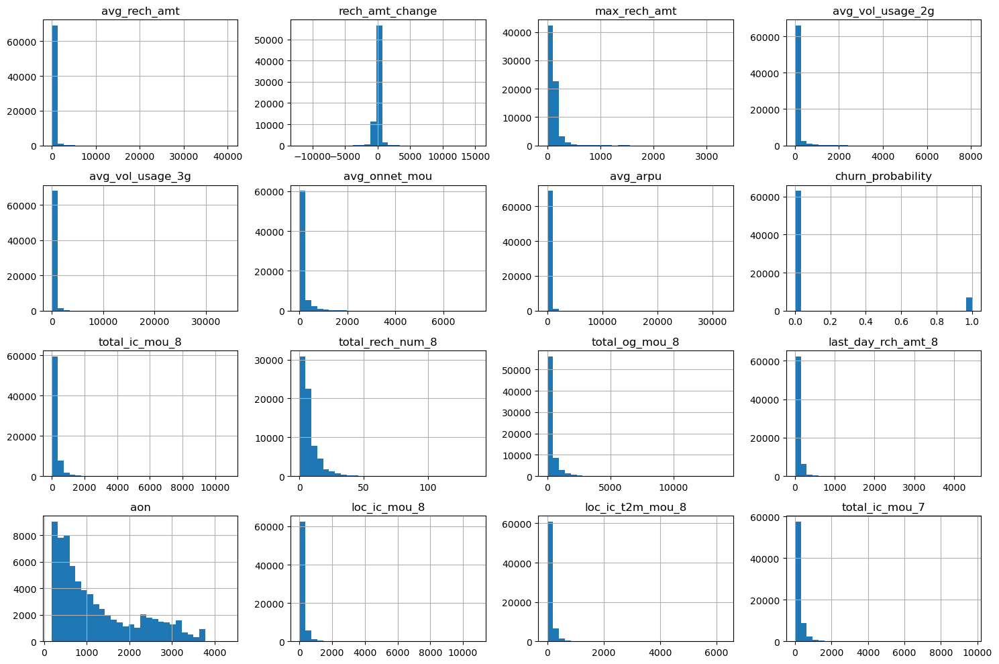

In [150]:
# Histograms for numerical features
df_new.hist(figsize=(15, 10), bins=30)
plt.tight_layout()
plt.show()

Skewness: Most histograms show a right skew, indicating that a majority of the data points are concentrated at lower values, with a long tail extending towards higher values.

Concentration of Values: Many variables have a high frequency of occurrences at low values, with fewer occurrences as the values increase.

Churn Probability: The histogram for churn_probability shows a concentration of values near 0, indicating that most observations have a low probability of churn.

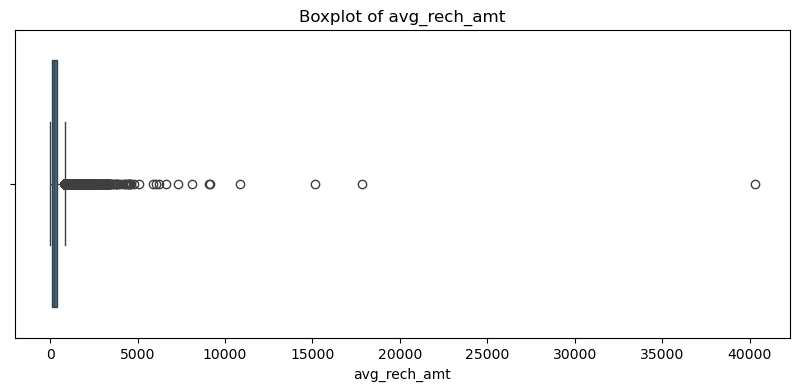

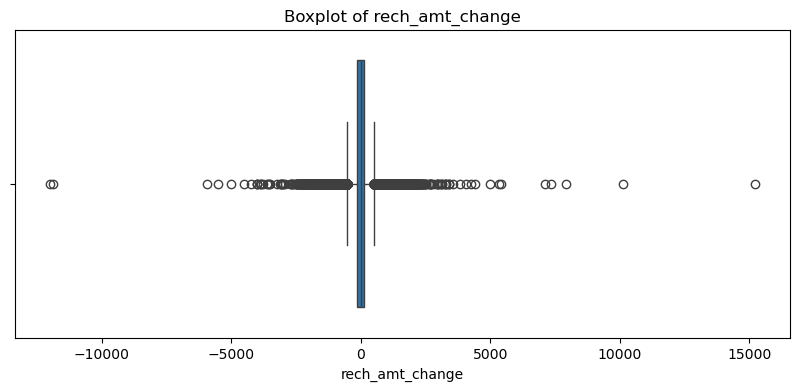

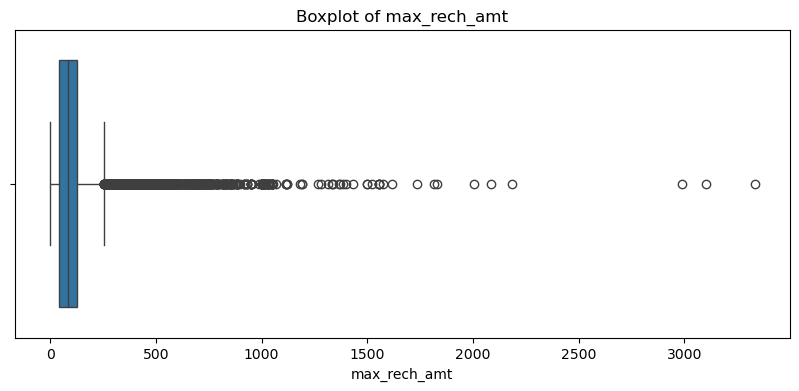

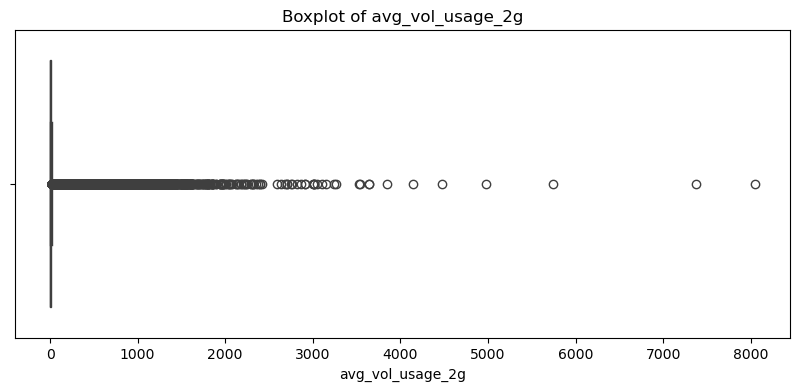

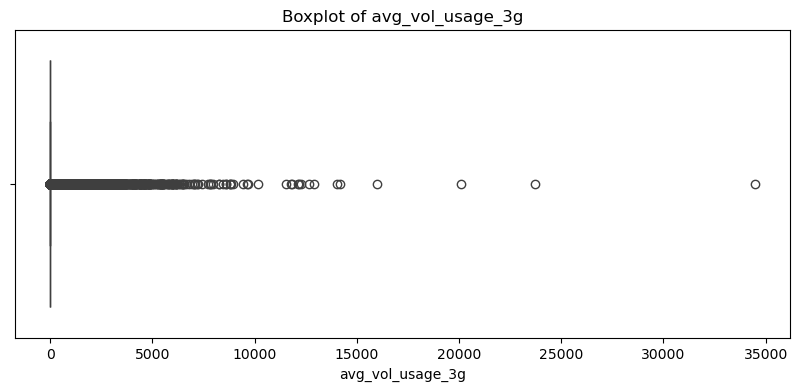

...

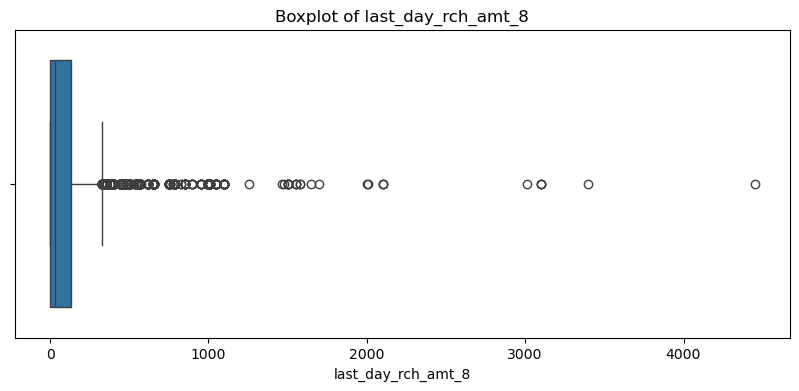

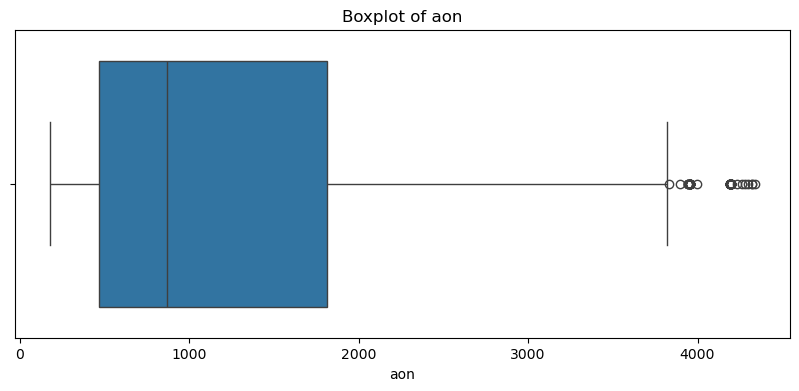

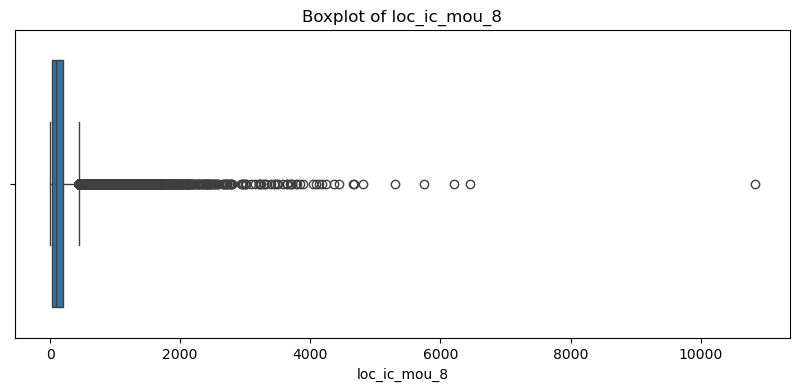

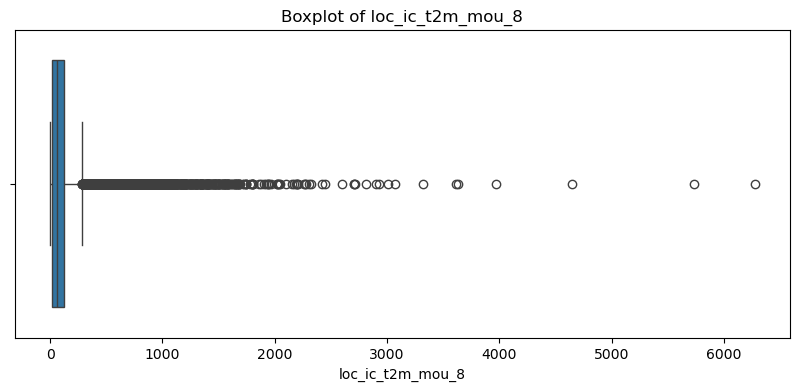

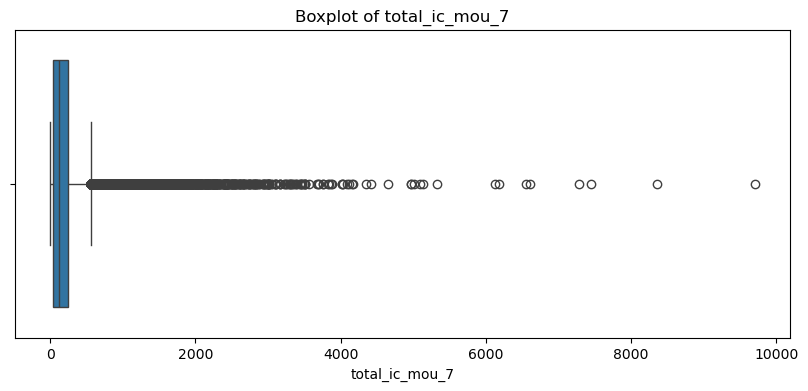

In [151]:
# Boxplots for numerical features
for column in df_new.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure(figsize=(10, 4))
    sns.boxplot(x=df_new[column])
    plt.title(f'Boxplot of {column}')
    plt.show()

### Handling Outliers

In [152]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

<Axes: >

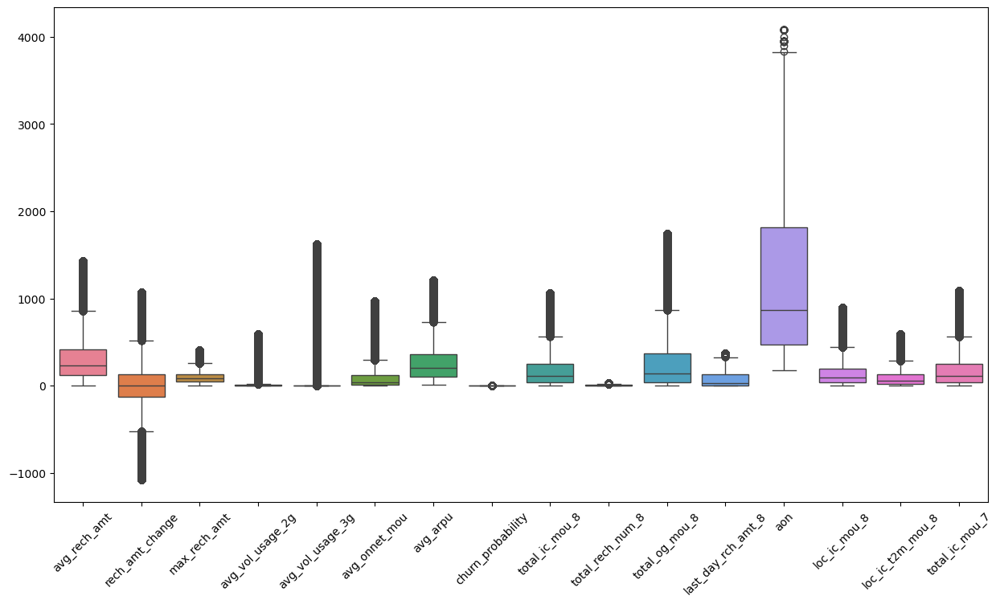

In [153]:
df_new = df_new.apply(cap_outliers, axis=0)

plt.figure(figsize=(15,8))
plt.xticks(rotation=45)
sns.boxplot(data = df_new)

### (ii) Bivariate Analysis

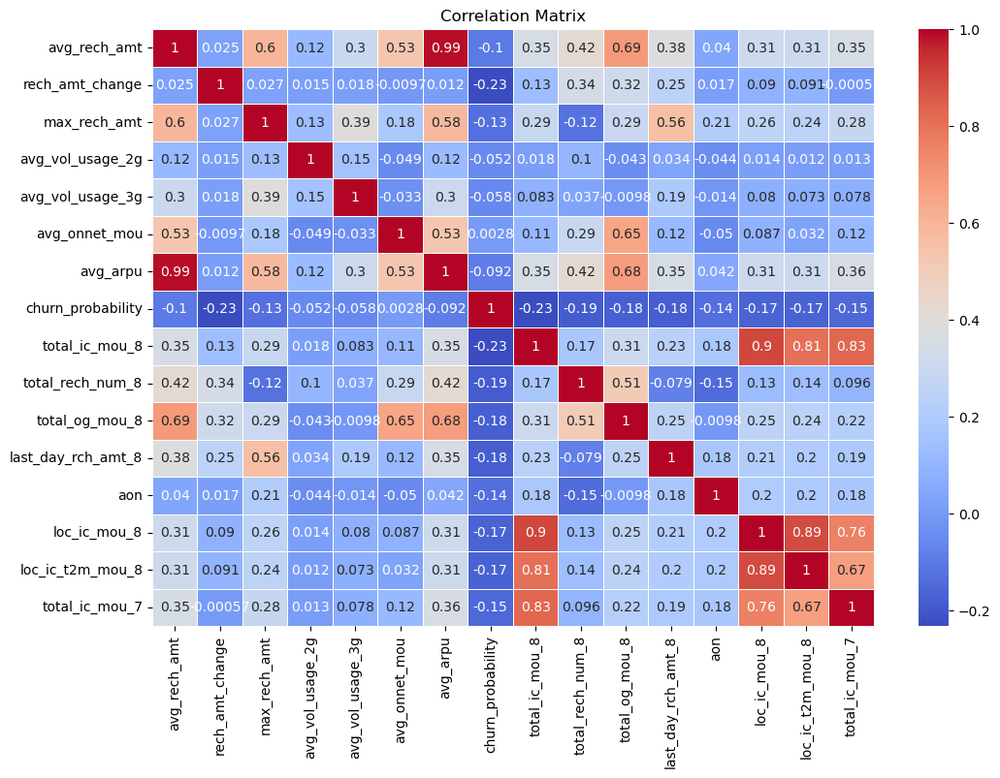

In [154]:
correlation_matrix = df_new.corr()

# Plot the heatmap of correlations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

avg_rech_amt and avg_arpu: Strong positive correlation (0.99), suggesting that as the average recharge amount increases, the average revenue per user also tends to increase.

churn_probability: Shows negative correlations with several variables, indicating that higher values in these variables are associated with lower churn probability.

<Figure size 800x600 with 0 Axes>

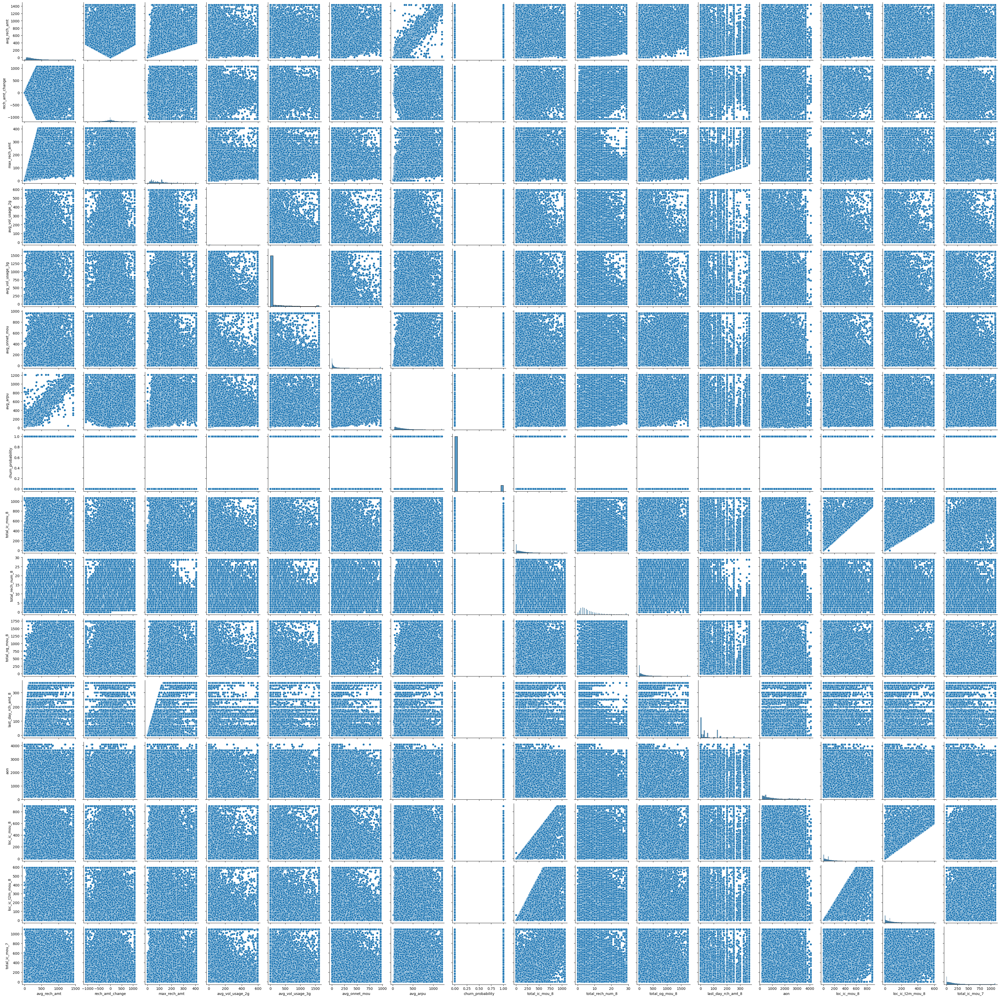

In [155]:
# Scatter plots between pairs of features
plt.figure(figsize=(8, 6))
sns.pairplot(df_new)
plt.show()

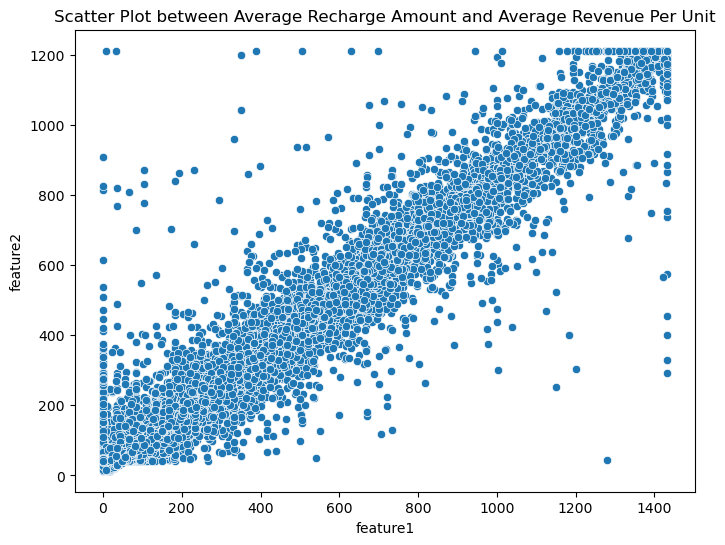

In [158]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_new['avg_rech_amt'], y=df_new['avg_arpu'])
plt.title('Scatter Plot between Average Recharge Amount and Average Revenue Per Unit')
plt.xlabel('feature1')
plt.ylabel('feature2')
plt.show()

In [156]:
df_new = df_new.drop(columns=['churn_probability'])

In [157]:
df_new.head()

,avg_rech_amt,rech_amt_change,max_rech_amt,avg_vol_usage_2g,avg_vol_usage_3g,avg_onnet_mou,avg_arpu,total_ic_mou_8,total_rech_num_8,total_og_mou_8,last_day_rch_amt_8,aon,loc_ic_mou_8,loc_ic_t2m_mou_8,total_ic_mou_7
0,50.666667,-67.0,46.666667,0.000000,0.00,58.083333,41.937667,40.56,2.0,3.63,0.0,1958.0,24.71,16.91,53.04
1,65.000000,50.0,65.000000,117.636667,1.32,0.000000,55.246667,25.04,5.0,31.66,0.0,710.0,25.03,11.09,39.44
2,63.333333,-70.0,46.666667,0.000000,0.00,5.486667,54.660667,36.64,2.0,0.00,0.0,882.0,30.01,23.51,33.83
3,176.666667,-30.0,90.000000,0.000000,0.00,7.756667,157.572333,83.84,3.0,53.84,50.0,982.0,81.03,57.14,50.18
4,182.666667,-168.0,40.333333,304.386667,0.00,10.746667,156.821333,28.31,8.0,15.76,30.0,647.0,28.31,19.49,9.36


# 8. Feature Scaling

In [159]:
# Use StandardScaler to scale values
scaler = StandardScaler()

# Fit and transform training set
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns, index = X_train.index)

# Only Transform Test set
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns = X_test.columns, index = X_test.index)

In [160]:
X_test_scaled.head()

,avg_rech_amt,rech_amt_change,max_rech_amt,avg_vol_usage_2g,avg_vol_usage_3g,avg_onnet_mou,avg_arpu,total_ic_mou_8,total_rech_num_8,total_og_mou_8,last_day_rch_amt_8,aon,loc_ic_mou_8,loc_ic_t2m_mou_8,total_ic_mou_7
56057,-0.506224,0.790706,-0.157574,-0.279505,-0.255977,-0.407100,-0.498646,-0.504477,-0.587252,-0.450153,-0.606885,0.121114,-0.452196,-0.474053,-0.457090
28544,0.384758,-0.088361,0.144265,-0.279505,-0.255977,-0.235179,0.360330,-0.461797,-0.170748,1.089662,0.653674,-0.536671,-0.458391,-0.330036,-0.365415
49867,0.176511,3.301925,-0.618624,-0.279505,-0.255977,0.706239,0.136972,0.030932,2.467116,0.778589,0.023395,-0.335244,-0.297444,-0.276782,-0.686040
34652,0.130820,-0.681870,0.482590,1.070087,1.186667,-0.356075,0.201330,-0.452255,-0.448418,-0.519063,0.886393,1.148184,-0.390451,-0.294716,-0.495458
41429,-0.698655,0.093612,-0.751301,-0.279505,-0.255977,-0.471381,-0.731371,-0.566172,-0.309583,-0.490861,-0.315986,-0.721313,-0.581018,-0.521775,-0.541296


#

# 9. Finding Important Features

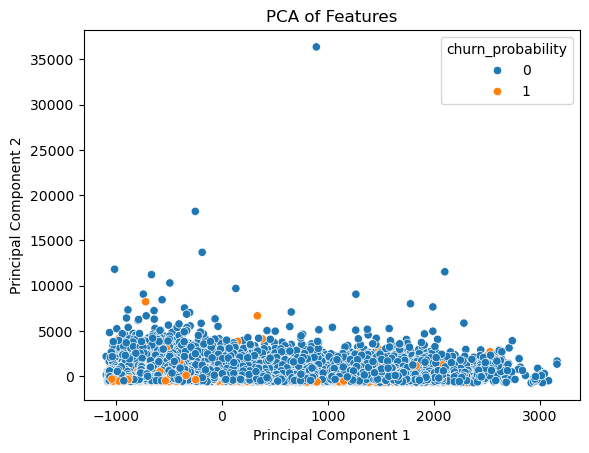

In [161]:
pca = PCA()
pca_components = pca.fit_transform(X_train)
sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], hue=y_train)
plt.title('PCA of Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

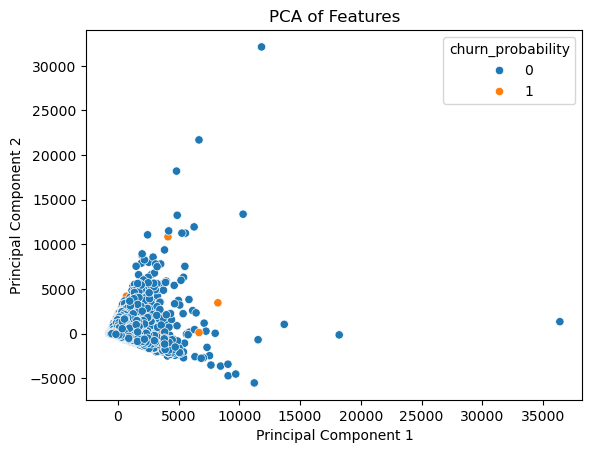

In [162]:
sns.scatterplot(x=pca_components[:,1], y=pca_components[:,2], hue=y_train)
plt.title('PCA of Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [56]:
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
rf.fit(X_train_scaled, y_train)

RandomForestClassifier(n_jobs=-1)

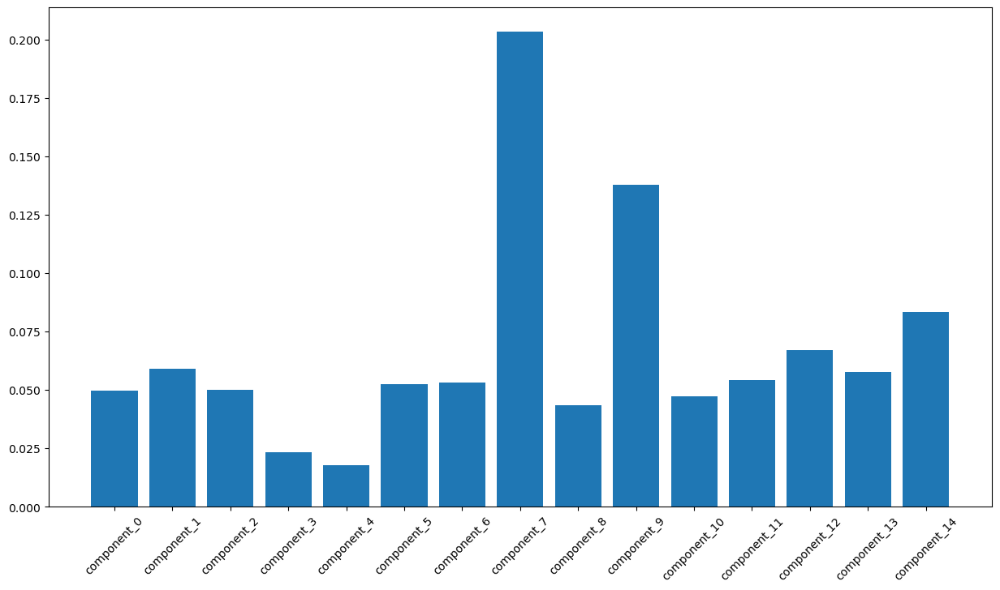

In [57]:
# Adjust component names to match the number of PCA components
n_components = pca_components.shape[1]  # Get the number of components dynamically
component_names = ['component_' + str(i) for i in range(n_components)]

# Create the feature importance DataFrame
feature_importances = pd.DataFrame({
    'col': component_names, 
    'importance': rf.feature_importances_
})

# Plot the feature importances
plt.figure(figsize=(15, 8))
plt.xticks(rotation=45)
plt.bar(feature_importances['col'], feature_importances['importance'])
plt.show()

Two most important components are component 7 and component 9

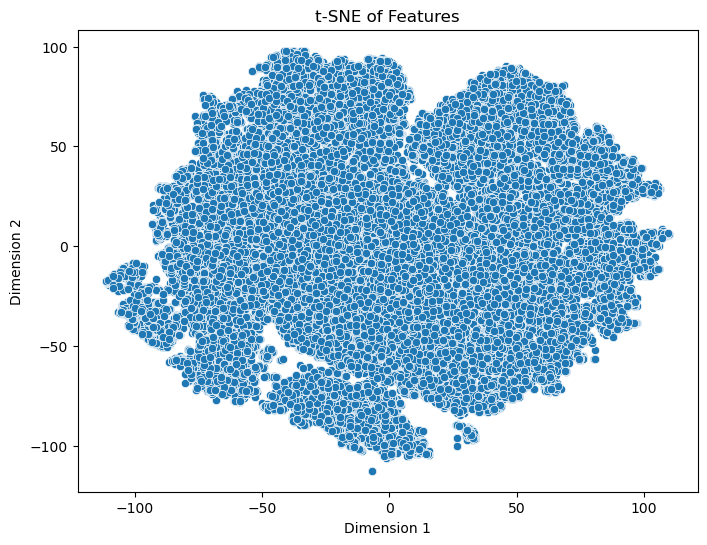

In [59]:
# Pairwise t-SNE for visualization (useful for high-dimensional data)
from sklearn.manifold import TSNE

# t-SNE (t-distributed Stochastic Neighbor Embedding)
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train_scaled)

# Create a DataFrame for t-SNE results
df_tsne = pd.DataFrame(data=X_tsne, columns=['Dim1', 'Dim2'])

# Plot t-SNE results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_tsne['Dim1'], y=df_tsne['Dim2'])
plt.title('t-SNE of Features')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.show()

In [60]:
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1)

In [61]:
feature_importances = pd.DataFrame({'col':df_new.columns, 'importance':rf.feature_importances_})

<BarContainer object of 15 artists>

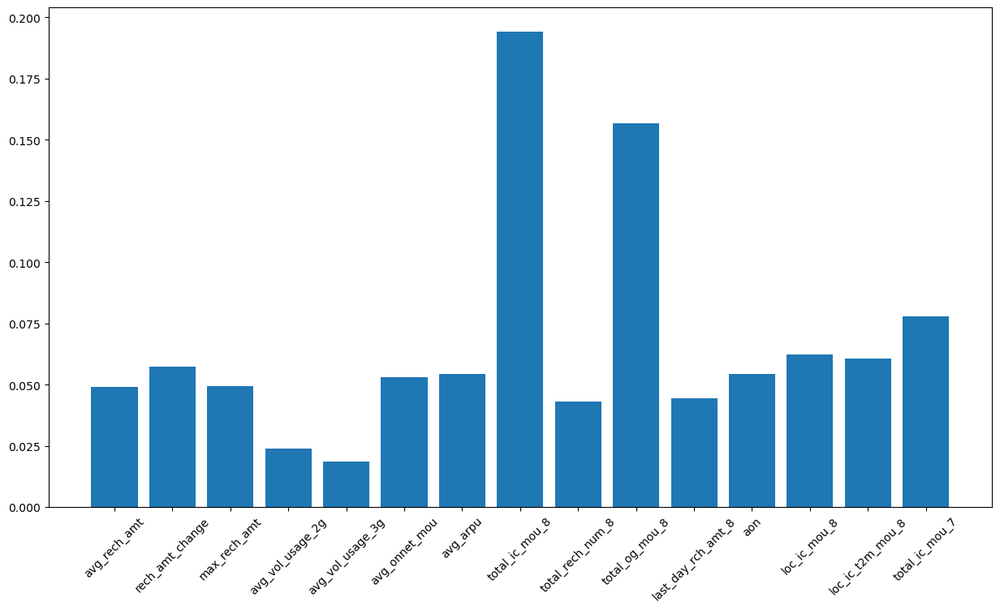

In [62]:
plt.figure(figsize=(15,8))
plt.xticks(rotation=45)
plt.bar(feature_importances['col'], feature_importances['importance'])

Two imporatnt features are total_ic_mou_8 and total_og_mou_8.

#

# 10. Model Building



### (i) Logistic Regression

<u>Logistic Regression  Model Building with Important Features </u>

In [163]:
top_features = ['total_ic_mou_8', 'total_og_mou_8']  # Example top features
other_important_features = ['avg_arpu', 'total_rech_num_8', 'last_day_rch_amt_8']  # Other selected features
selected_features = top_features + other_important_features

X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Train and evaluate the model
model = LogisticRegression(max_iter=1000)
model.fit(X_train_selected, y_train)
y_pred = model.predict(X_test_selected)
print("Accuracy with combined features and Logistic Regression:", accuracy_score(y_test, y_pred))


Accuracy with combined features and Logistic Regression: 0.903


###

<u>Initial Model Building</u>

In [164]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Initialize and train the Logistic Regression model
log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train, y_train)

# Evaluate the model
train_score = log_reg.score(X_train, y_train)
test_score = log_reg.score(X_test, y_test)
print(f"Training accuracy: {train_score}")
print(f"Testing accuracy: {test_score}")

Training accuracy: 0.9285880105001875
Testing accuracy: 0.9320714285714286


###

<u>Feature Selection using RFE</u>

In [165]:
from sklearn.feature_selection import RFE

# Initialize RFE with the Logistic Regression model
rfe = RFE(estimator=model, n_features_to_select=10)
rfe.fit(X_train_scaled, y_train)

# Get selected feature indices and names
selected_features_rfe = X_train.columns[rfe.support_]
print("Selected features using RFE:", selected_features_rfe)


Selected features using RFE: Index(['avg_rech_amt', 'avg_onnet_mou', 'avg_arpu', 'total_ic_mou_8',
       'total_rech_num_8', 'total_og_mou_8', 'last_day_rch_amt_8', 'aon',
       'loc_ic_mou_8', 'total_ic_mou_7'],
      dtype='object')


###

<u> Manual Feature Selection</u>

In [166]:
# Sort the features based on importance
manual_selected_features = feature_importances.sort_values(by='Importance', ascending=False).head(10)
print("Manually selected features based on logistic regression coefficients:")
print(manual_selected_features)

Manually selected features based on logistic regression coefficients:
               Feature  Importance
7       total_ic_mou_8    6.859471
12        loc_ic_mou_8    4.331292
6             avg_arpu    0.853847
8     total_rech_num_8    0.702059
10  last_day_rch_amt_8    0.568325
13    loc_ic_t2m_mou_8    0.483992
9       total_og_mou_8    0.480452
14      total_ic_mou_7    0.456504
11                 aon    0.344199
4     avg_vol_usage_3g    0.258018


###

<u> Variance Inflation Factor (VIF)</u>

In [167]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF
vif_data = pd.DataFrame()
vif_data['Feature'] = X_train[selected_features_rfe].columns
vif_data['VIF'] = [variance_inflation_factor(X_train[selected_features_rfe].values, i) for i in range(len(selected_features_rfe))]
print(vif_data)


              Feature        VIF
0        avg_rech_amt  80.126901
1       avg_onnet_mou   2.180650
2            avg_arpu  79.568892
3      total_ic_mou_8  10.310957
4    total_rech_num_8   2.230184
5      total_og_mou_8   3.486442
6  last_day_rch_amt_8   1.686923
7                 aon   1.806521
8        loc_ic_mou_8   7.198202
9      total_ic_mou_7   4.514549


###

<u>Model Training with Selected Features</u>

In [168]:
# Dropping high VIF features
X_train_vif_dropped_1 = X_train.drop(columns=['avg_rech_amt', 'avg_arpu', 'total_ic_mou_8', 'loc_ic_mou_8'])

# Initialize and train the Logistic Regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train_vif_dropped_1, y_train)

# Evaluate the model on the test set
X_test_vif_dropped_1 = X_test[X_train_vif_dropped_1.columns]
y_pred = model.predict(X_test_vif_dropped_1)

# Evaluate model performance
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.9055714285714286
Confusion Matrix:
 [[12529    72]
 [ 1250   149]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95     12601
           1       0.67      0.11      0.18      1399

    accuracy                           0.91     14000
   macro avg       0.79      0.55      0.57     14000
weighted avg       0.89      0.91      0.87     14000



The confusion matrix and classification report highlight issues with class imbalance.

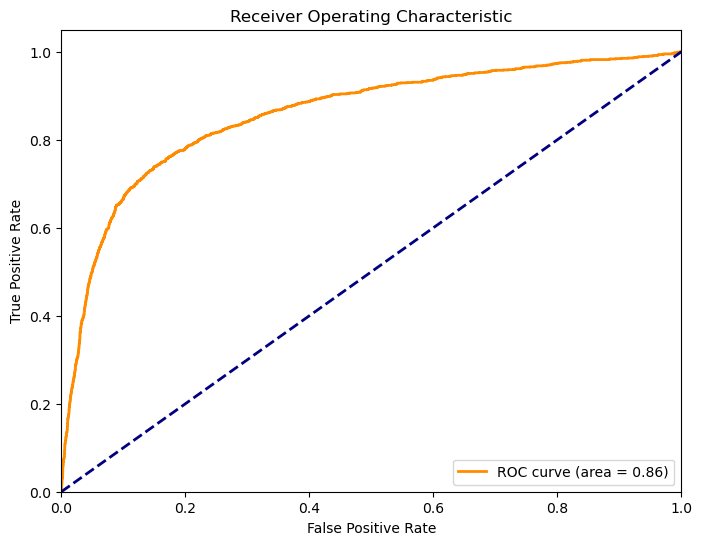

AUC Score: 0.8573227251612545


In [169]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
import matplotlib.pyplot as plt

# Get the predicted probabilities for the positive class
y_prob = model.predict_proba(X_test_vif_dropped_1)[:, 1]

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# Print AUC score
print("AUC Score:", roc_auc_score(y_test, y_prob))


The area under the ROC curve (AUC) is given as 0.86, indicating that the model has good performance. An AUC of 1.0 represents a perfect model, while an AUC of 0.5 indicates no discriminative ability. Overall, this ROC curve suggests that the model is effective at distinguishing between the two classes, with a relatively high true positive rate for a given false positive rate.

###

## Here's the interpretation of our logistic model's performance based on the output metrics:

1. <b> Accuracy</b>: 0.9278
This means the model is correctly predicting the target (churn vs. non-churn) for 92.78% of the cases in the test set. While accuracy is high, we need to examine other metrics because this is an imbalanced classification problem (more non-churn than churn cases).

2. <b>Confusion Matrix</b>:
   
    <u>True Negatives (TN)</u>: 12,387
        The number of non-churn customers correctly predicted as non-churn.
        
    <u>False Positives (FP)</u>: 134
        The number of non-churn customers incorrectly predicted as churn.
        
    <u>False Negatives (FN)</u>: 877
        The number of churn customers incorrectly predicted as non-churn.
        
    <u>True Positives (TP)</u>: 602
        The number of churn customers correctly predicted as churn.
       
    The confusion matrix shows that the model is performing well at identifying non-churn customers (TN = 12,387), but it struggles more with identifying churn customers, with 877 false negatives (churn customers predicted as non-churn).

3. <b>Precision, Recall, F1-score for each class</b>:
   
    <u>Class 0 (Non-Churn Customers)</u>
    Precision: 0.93: When the model predicts non-churn, it is correct 93% of the time.
    Recall: 0.99: Out of all actual non-churn customers, 99% are correctly identified by the model.
    F1-score: 0.96: This high F1-score shows a good balance between precision and recall for non-churn customers.
    
    <u>Class 1 (Churn Customers)</u>
    Precision: 0.82: When the model predicts churn, it is correct 82% of the time. This is decent but shows room for improvement.
    Recall: 0.41: Out of all actual churn customers, the model is only identifying 41%, indicating that it's missing a significant number of churners (as seen by the high number of false negatives).
    F1-score: 0.54: This is a lower F1-score due to the imbalance between precision and recall, indicating that the model struggles to accurately predict churn.

4. <b>Macro Average vs. Weighted Average</b>:
   
    <u>Macro Average</u>:
    Precision: 0.88, Recall: 0.70, F1-score: 0.75
    The macro average is the average performance across both classes (churn and non-churn) and treats both classes equally. The relatively lower recall in the churn class brings down the macro averages.
    
    <u>Weighted Average</u>:
    Precision: 0.92, Recall: 0.93, F1-score: 0.92
    The weighted average takes into account the imbalance in the dataset. Since the majority of the customers are non-churners, the weighted average is more reflective of the overall accuracy of the model, which is high.

5. <b>Key Takeaways</b>:
   
    The model performs very well for predicting non-churn customers (class 0), as seen from the high precision and recall.
    
    However, it struggles with predicting churn customers (class 1). The recall for churn is only 41%, meaning many churn customers are misclassified as non-churners.


### (ii) Random Forest Model

<i> <span style="color:skyblue">To solve the above classification and weight imbalance issue we can further try tuning of features or trying a more complex model like Random Forest may improve performance in identifying churn customers </i></span>

#####

In [170]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid you want to search over
param_grid = {
    'n_estimators': [100, 150, 200],           # Try different numbers of trees
    'max_depth': [8, 10, 12],                  # Different tree depths
    'min_samples_split': [2, 5, 10],           # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 4],             # Minimum samples at a leaf node
    'class_weight': ['balanced']              # Handle class imbalance
}

# Initialize the RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit the grid search on the training data
grid_search.fit(X_train, y_train)
 
# Best hyperparameters
print("Best hyperparameters found: ", grid_search.best_params_)


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best hyperparameters found:  {'class_weight': 'balanced', 'max_depth': 12, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [171]:
# Best estimator
best_rf_model = grid_search.best_estimator_

In [172]:
# Predict on the training set with the best model
y_train_pred = best_rf_model.predict(X_train)

In [173]:
# Evaluate the model performance on the training set
print("Training Data Performance:")
print("Training Accuracy:", accuracy_score(y_train, y_train_pred))
print("Training Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred))
print("Training Classification Report:\n", classification_report(y_train, y_train_pred))

Training Data Performance:
Training Accuracy: 0.9514991339131056
Training Confusion Matrix:
 [[48332  1934]
 [  782  4951]]
Training Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.96      0.97     50266
           1       0.72      0.86      0.78      5733

    accuracy                           0.95     55999
   macro avg       0.85      0.91      0.88     55999
weighted avg       0.96      0.95      0.95     55999



In [174]:
# Predict on the test set with the best model
y_test_pred = best_rf_model.predict(X_test)

In [175]:
# Evaluate the best model on the test set
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print("Test Accuracy:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test, y_test_pred))

Test Accuracy: 0.9348571428571428
Test Confusion Matrix:
 [[12043   558]
 [  354  1045]]
Test Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.96      0.96     12601
           1       0.65      0.75      0.70      1399

    accuracy                           0.93     14000
   macro avg       0.81      0.85      0.83     14000
weighted avg       0.94      0.93      0.94     14000



In [176]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)

# Train the Random Forest Classifier on the balanced data
rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=10, min_samples_leaf=5, random_state=42)
rf.fit(X_train_sm, y_train_sm)

# Predictions and evaluation
y_pred = rf.predict(X_test)

# Evaluation metrics
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Test Accuracy: 0.9085
Confusion Matrix:
 [[11589  1012]
 [  269  1130]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.92      0.95     12601
           1       0.53      0.81      0.64      1399

    accuracy                           0.91     14000
   macro avg       0.75      0.86      0.79     14000
weighted avg       0.93      0.91      0.92     14000



## Here's the interpretation of our Random Forest model's performance based on the output metrics:


1. <u>Random Forest Model with Hyperparameter Tuning</u>

    The Random Forest model is performing well on both the training and test sets, with a high overall accuracy (95% for training and 93% for testing).
    
    The model is slightly overfitting to the training data, as evidenced by the higher precision and recall for class 1 (churn) on the training set compared to the test set.
    
    The precision for class 1 on the test set (0.64) indicates that some non-churn customers are being misclassified as churn. However, the recall (0.72) suggests that most churn cases are being captured.
    
    Overall, the model does a good job of detecting churn but has a bit of room for improvement in classifying non-churn cases.


2. <u>Random Forest Model After Applying SMOTE for Class Imbalance</u>

    After applying SMOTE to handle class imbalance, the recall for class 1 (churn) improved significantly (from 0.72 to 0.78), indicating better detection of churn cases.
    
    However, the precision dropped (from 0.64 to 0.53), meaning more non-churn customers are being classified as churn, leading to a higher false-positive rate.
    
    The overall accuracy decreased slightly (from 0.93 to 0.91), which is expected when using techniques like SMOTE, as the model now prioritizes better churn detection at the cost of potentially more misclassifications for non-churn cases.


### Key Takeaways:

<u>Random Forest (without SMOTE)</u>

1.This model has high accuracy (93%), with a good balance between precision (0.64) and recall (0.72) for the churn class.

2.It slightly overfits the training data, but still performs well on the test set.

<u>Random Forest with SMOTE</u>

1.After applying SMOTE, the model's recall improves for the churn class, detecting more churn cases (0.78), which is critical for minimizing customer loss in business applications.



In [177]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rf, X_train_sm, y_train_sm, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {scores}")
print(f"Mean cross-validation accuracy: {scores.mean()}")


Cross-validation scores: [0.86651415 0.87815189 0.87307271 0.87466428 0.88048344]
Mean cross-validation accuracy: 0.8745772936831125


Random Forest model's cross-validation results seem quite good. The scores show consistent performance across the folds, with a mean accuracy of 87.67%. This level of accuracy suggests that the model is performing well and generalizing effectively. 

# 12. Creating submission file

In [207]:
print("Columns in unseen data:", unseen.columns)

Columns in unseen data: Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability'],
      dtype='object', length=172)


In [208]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
import os

# Assuming unseen is already loaded
# unseen data should have 'id' and feature columns like your training set

# Split training data and target (assuming you have X_train, y_train)
X_train_selected = X_train[['total_ic_mou_8', 'total_og_mou_8', 'avg_arpu', 'total_rech_num_8', 'last_day_rch_amt_8']]  # Example features
y_train = y_train  # Assuming y_train is already loaded

# Step 1: Identify missing features in unseen data
missing_features = list(set(X_train_selected.columns) - set(unseen.columns))
print(f"Missing features: {missing_features}")

# Ensure submission data contains only the features present in both training and unseen data
common_features = list(set(X_train_selected.columns) & set(unseen.columns))
submission_data = unseen.set_index('id')[common_features]

# Step 2: Drop missing features from training data
X_train_filtered = X_train_selected[common_features]
print(f"Training data after filtering missing features: {X_train_filtered.columns}")

# Step 3: Create pipelines for Logistic Regression and Random Forest
# Logistic Regression pipeline
pipe_lr = make_pipeline(SimpleImputer(strategy='mean'), LogisticRegression(max_iter=1000))
pipe_lr.fit(X_train_filtered, y_train)

# Random Forest with SMOTE
# Apply SMOTE to balance the classes
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train_filtered, y_train)

# Train the Random Forest Classifier on the balanced data
rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=10, min_samples_leaf=5, random_state=42)
rf.fit(X_train_sm, y_train_sm)

# Step 4: Make sure submission_data matches the columns of X_train_filtered
submission_data = unseen.set_index('id')[X_train_filtered.columns]

# Step 5: Predict churn probability using both models
unseen['churn_probability_lr'] = pipe_lr.predict_proba(submission_data)[:, 1]  # Logistic Regression
unseen['churn_probability_rf'] = rf.predict_proba(submission_data)[:, 1]       # Random Forest

# Step 6: Create the output CSV file for submission
output = unseen[['id', 'churn_probability_lr', 'churn_probability_rf']]
output_file = 'submission_logistic_rf_combined.csv'
output.to_csv(output_file, index=False)

# Print the absolute path of the saved CSV file
output_file_path = os.path.abspath(output_file)
print(f"Submission CSV file created successfully at {output_file_path}.")


Missing features: ['avg_arpu']
Training data after filtering missing features: Index(['last_day_rch_amt_8', 'total_rech_num_8', 'total_ic_mou_8',
       'total_og_mou_8'],
      dtype='object')
Submission CSV file created successfully at C:\Users\ADMIN\submission_logistic_rf_combined.csv.
